In [1]:
# Import necessary libraries
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import plotly.express as px
import plotly.graph_objects as go

The Crop Yield Prediction Dataset provides an invaluable resource for studying the interplay between agricultural practices, environmental factors, and their impact on crop production.

This dataset merges information from reputable sources such as the **Food and Agriculture Organization (FAO) and the World Data Bank**. It incorporates key variables like pesticide usage, historical crop yield, average temperature, and rainfall, offering a comprehensive view of the factors influencing agricultural output. The dataset is meticulously processed and includes a final cleaned and merged file (yield_df.csv), combining critical data points for easy analysis.

**Why is This Dataset Important?**

Food Security: With the global population steadily increasing, ensuring a stable food supply is paramount. This dataset equips researchers and policymakers with the data needed to predict and optimize crop yields, ensuring adequate production to meet demand.

Climate Change Impact: Changes in temperature and rainfall patterns due to climate change directly affect agricultural productivity. This dataset provides essential insights into how these variables influence crop yields, helping to design strategies to combat adverse effects.

Agricultural Risk Management: By analyzing trends in crop yield, pesticide usage, and weather conditions, stakeholders can make informed decisions to reduce risks in agriculture, such as crop failure or resource wastage.

Global Economic Relevance: Agriculture remains a significant driver of the economy in many countries. Understanding crop yields can help forecast economic performance, trade flows, and resource allocation.

##### Data Sources:
FAO (Food and Agriculture Organization):
Provides data on pesticides and yield.\
World Data Bank:
Supplies data on rainfall and average temperature.\
Processed Dataset:
yield_df.csv: A cleaned and merged dataset that combines information on pesticides, yield, rainfall, and average temperature for further analysis.


In [3]:
crop_yield_df=pd.read_csv("yield_df.csv")
crop_yield_df.head()

,Unnamed: 0,Area,Item,Year,hg/ha_yield,average_rain_fall_mm_per_year,pesticides_tonnes,avg_temp
0,0,Albania,Maize,1990,36613,1485.0,121.0,16.37
1,1,Albania,Potatoes,1990,66667,1485.0,121.0,16.37
2,2,Albania,"Rice, paddy",1990,23333,1485.0,121.0,16.37
3,3,Albania,Sorghum,1990,12500,1485.0,121.0,16.37
4,4,Albania,Soybeans,1990,7000,1485.0,121.0,16.37


In [8]:
if 'Unnamed: 0' in crop_yield_df.columns:
    crop_yield_df = crop_yield_df.drop(columns=['Unnamed: 0'])

In [9]:
crop_yield_df.head()

,Area,Item,Year,hg/ha_yield,average_rain_fall_mm_per_year,pesticides_tonnes,avg_temp
0,Albania,Maize,1990,36613,1485.0,121.0,16.37
1,Albania,Potatoes,1990,66667,1485.0,121.0,16.37
2,Albania,"Rice, paddy",1990,23333,1485.0,121.0,16.37
3,Albania,Sorghum,1990,12500,1485.0,121.0,16.37
4,Albania,Soybeans,1990,7000,1485.0,121.0,16.37


In [11]:
crop_yield_df.isnull().sum()

Area                             0
Item                             0
Year                             0
hg/ha_yield                      0
average_rain_fall_mm_per_year    0
pesticides_tonnes                0
avg_temp                         0
dtype: int64

In [14]:
eda_yield_combined = crop_yield_df.describe(include='all').transpose()
eda_yield_combined

,count,unique,top,freq,mean,std,min,25%,50%,75%,max
Area,28242,101,India,4048,NaN,NaN,NaN,NaN,NaN,NaN,NaN
Item,28242,10,Potatoes,4276,NaN,NaN,NaN,NaN,NaN,NaN,NaN
Year,28242.0,NaN,NaN,NaN,2001.544296,7.051905,1990.0,1995.0,2001.0,2008.0,2013.0
hg/ha_yield,28242.0,NaN,NaN,NaN,77053.332094,84956.612897,50.0,19919.25,38295.0,104676.75,501412.0
average_rain_fall_mm_per_year,28242.0,NaN,NaN,NaN,1149.05598,709.81215,51.0,593.0,1083.0,1668.0,3240.0
pesticides_tonnes,28242.0,NaN,NaN,NaN,37076.909344,59958.784665,0.04,1702.0,17529.44,48687.88,367778.0
avg_temp,28242.0,NaN,NaN,NaN,20.542627,6.312051,1.3,16.7025,21.51,26.0,30.65


**EDA Summary:** \
Area: 101 unique areas; the most frequent is India (4,048 occurrences).\
Item: 10 unique crops; the most frequent is Potatoes (4,276 occurrences).\
Year: Ranges from 1990 to 2013, with an average year of approximately 2001.\
hg/ha_yield: Yield per hectare ranges widely from 50 to 501,412, with a median of 38,295.\
average_rain_fall_mm_per_year: Ranges from 51 mm to 3,240 mm, with an average of ~1,149 mm.\
pesticides_tonnes and avg_temp are already cleaned and have no missing values.

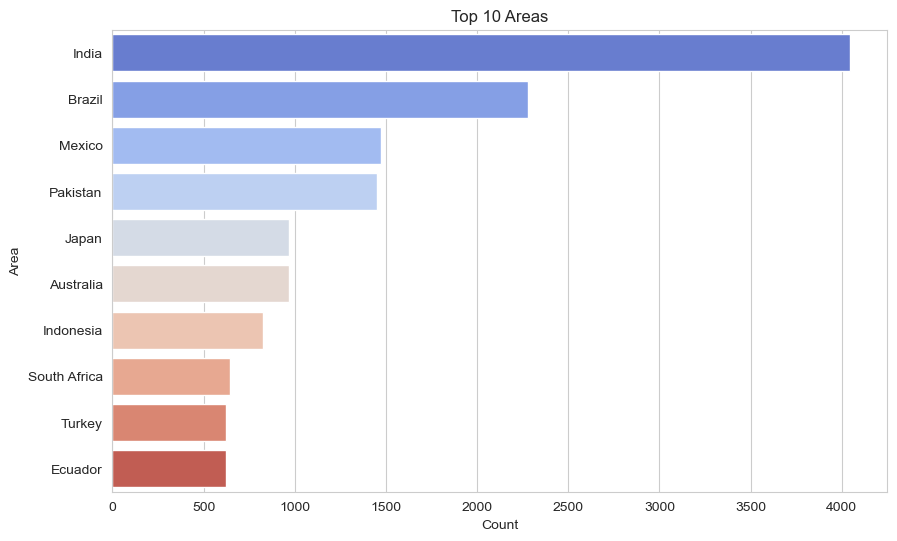

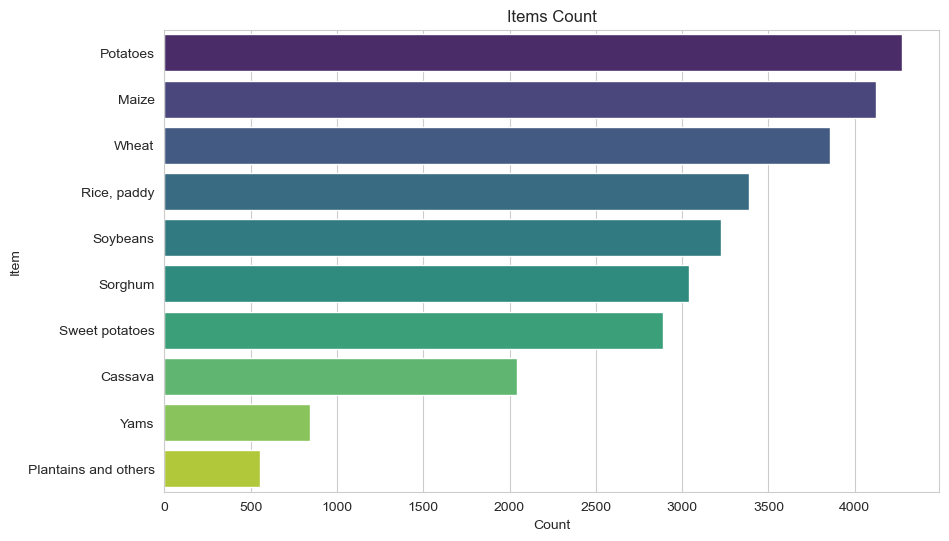

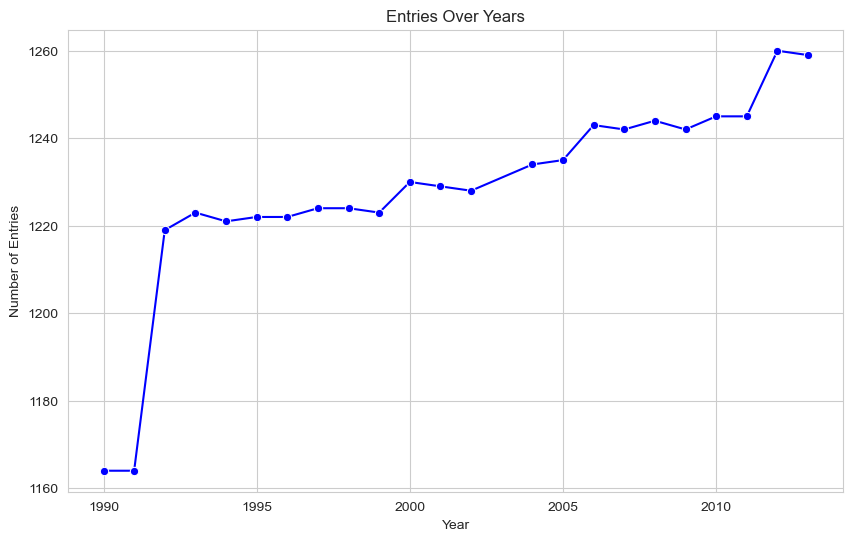

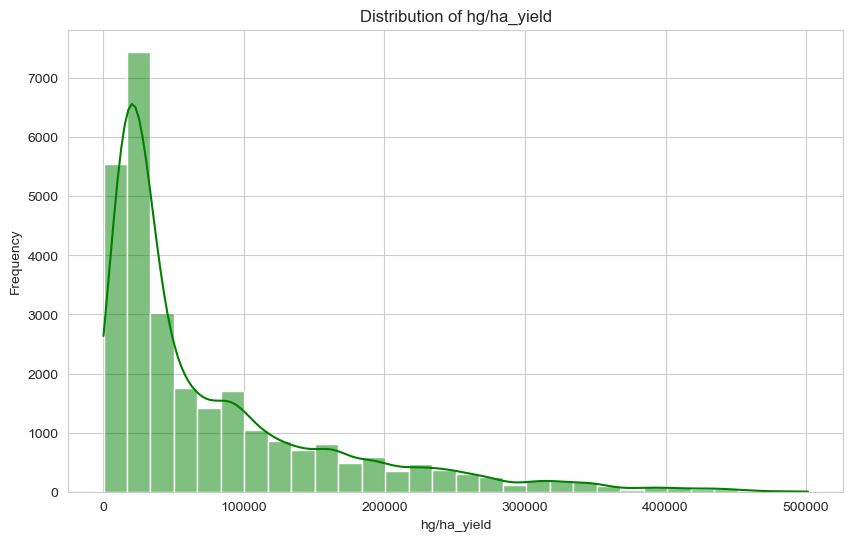

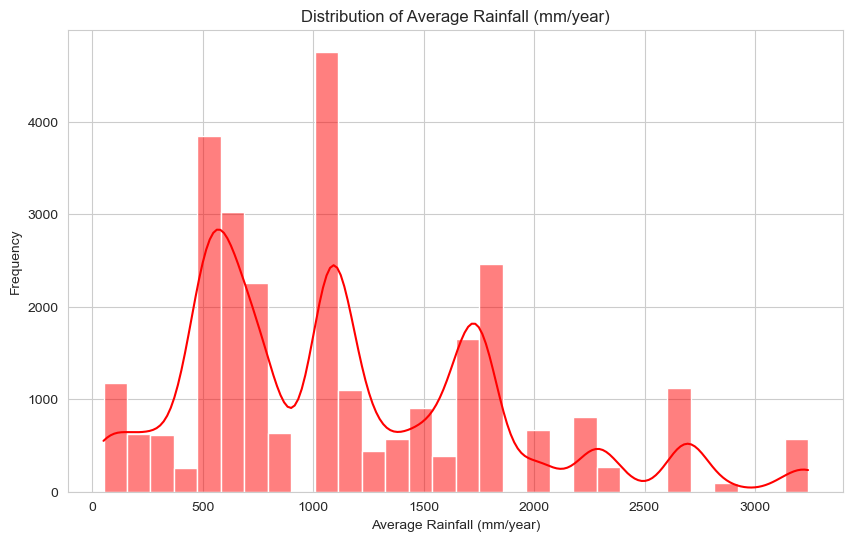

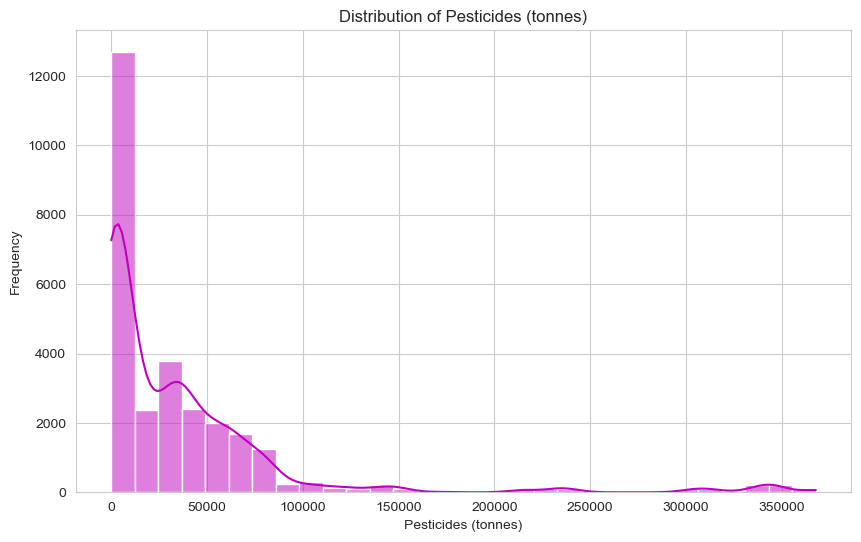

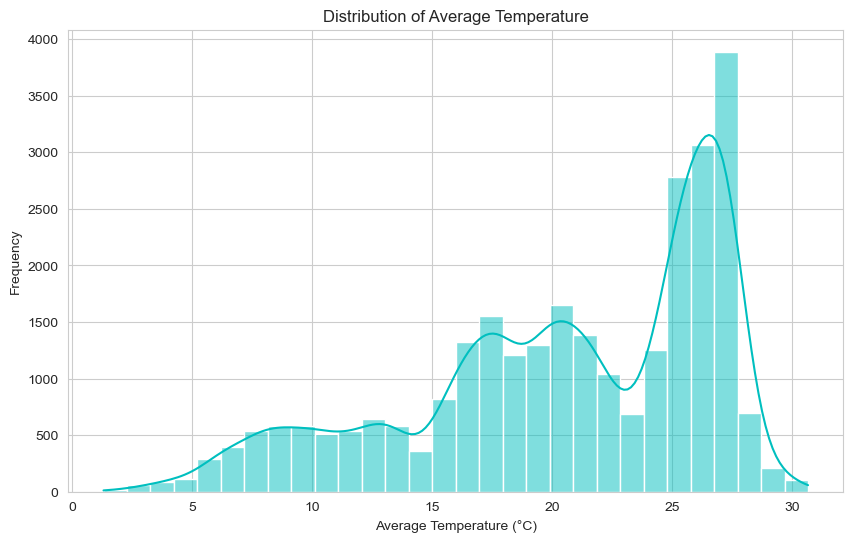

In [21]:
# Plot for each column with appropriate visualizations

import matplotlib.pyplot as plt
import seaborn as sns

# Set the aesthetic style of the plots
sns.set_style("whitegrid")

# Increase the default figure size for better readability
plt.rcParams['figure.figsize'] = [10, 6]

## Area (Bar Plot of Top 10 Areas)
plt.figure()
area_counts = crop_yield_df['Area'].value_counts().head(10)
sns.barplot(x=area_counts.values, y=area_counts.index, palette='coolwarm')
plt.title('Top 10 Areas')
plt.xlabel('Count')
plt.ylabel('Area')
plt.show()

## Item (Bar Plot of Items)
plt.figure()
item_counts = crop_yield_df['Item'].value_counts()
sns.barplot(x=item_counts.values, y=item_counts.index, palette='viridis')
plt.title('Items Count')
plt.xlabel('Count')
plt.ylabel('Item')
plt.show()

## Year (Line Plot of Entries Over Years)
plt.figure()
year_counts = crop_yield_df['Year'].value_counts().sort_index()
sns.lineplot(x=year_counts.index, y=year_counts.values, marker='o', color='b')
plt.title('Entries Over Years')
plt.xlabel('Year')
plt.ylabel('Number of Entries')
plt.show()

## hg/ha_yield (Histogram)
plt.figure()
sns.histplot(crop_yield_df['hg/ha_yield'], bins=30, kde=True, color='g')
plt.title('Distribution of hg/ha_yield')
plt.xlabel('hg/ha_yield')
plt.ylabel('Frequency')
plt.show()

## average_rain_fall_mm_per_year (Histogram)
plt.figure()
sns.histplot(crop_yield_df['average_rain_fall_mm_per_year'], bins=30, kde=True, color='r')
plt.title('Distribution of Average Rainfall (mm/year)')
plt.xlabel('Average Rainfall (mm/year)')
plt.ylabel('Frequency')
plt.show()

## pesticides_tonnes (Histogram)
plt.figure()
sns.histplot(crop_yield_df['pesticides_tonnes'], bins=30, kde=True, color='m')
plt.title('Distribution of Pesticides (tonnes)')
plt.xlabel('Pesticides (tonnes)')
plt.ylabel('Frequency')
plt.show()

## avg_temp (Histogram)
plt.figure()
sns.histplot(crop_yield_df['avg_temp'], bins=30, kde=True, color='c')
plt.title('Distribution of Average Temperature')
plt.xlabel('Average Temperature (°C)')
plt.ylabel('Frequency')
plt.show()

## Explanation and Insights from the Graphs

The visualizations presented provide a comprehensive overview of the `crop_yield_df` dataset, highlighting key attributes and their distributions.

### **Top 10 Areas (Bar Plot)**
- **Why this plot?**  
  The bar plot of the top 10 areas allows us to identify the regions contributing the most data to the dataset. This is critical in understanding geographical patterns and focusing on the most significant contributors.
- **Insights:**  
  India dominates the dataset, followed by Brazil and Mexico. This indicates a significant contribution of data from these countries, likely reflecting their importance in global agriculture.

### **Items Count (Bar Plot)**
- **Why this plot?**  
  Understanding the distribution of crop types (items) helps us identify the crops with the most data entries, aiding in crop-specific analysis.
- **Insights:**  
  Potatoes and Maize have the highest counts, suggesting that these crops are prioritized in data collection, possibly due to their global importance.

### **Entries Over Years (Line Plot)**
- **Why this plot?**  
  Tracking the number of entries over time highlights trends in data collection and allows us to observe if there is growth or stagnation in agricultural data availability.
- **Insights:**  
  The dataset shows an increasing number of entries over the years, reflecting improved data collection methods or greater agricultural focus in recent decades.

### **Distribution of `hg/ha_yield` (Histogram)**
- **Why this plot?**  
  The histogram provides an overview of the yield distribution, helping us identify typical values and potential outliers.
- **Insights:**  
  The data is highly skewed, with most yields concentrated at lower values, while a few entries show extremely high yields.

### **Distribution of Average Rainfall (Histogram)**
- **Why this plot?**  
  Rainfall is a crucial environmental factor influencing crop yield. This plot helps understand the variability in average rainfall across regions and years.
- **Insights:**  
  The rainfall data is multimodal, indicating varying climatic conditions in the contributing areas, with significant clusters around specific values.

### **Distribution of Pesticides Usage (Histogram)**
- **Why this plot?**  
  Pesticides are a critical input in agriculture. Understanding their distribution helps evaluate their usage patterns and identify anomalies.
- **Insights:**  
  The pesticide usage is highly concentrated at lower values, with a long tail indicating a few regions with very high usage, likely reflecting intensive farming practices.

### **Distribution of Average Temperature (Histogram)**
- **Why this plot?**  
  Temperature is another vital environmental factor affecting crop yield. This plot provides insights into the climatic range covered in the dataset.
- **Insights:**  
  The temperature distribution shows distinct peaks, corresponding to the range of climates in the dataset. The majority of temperatures fall within a moderate range, reflecting typical growing conditions.


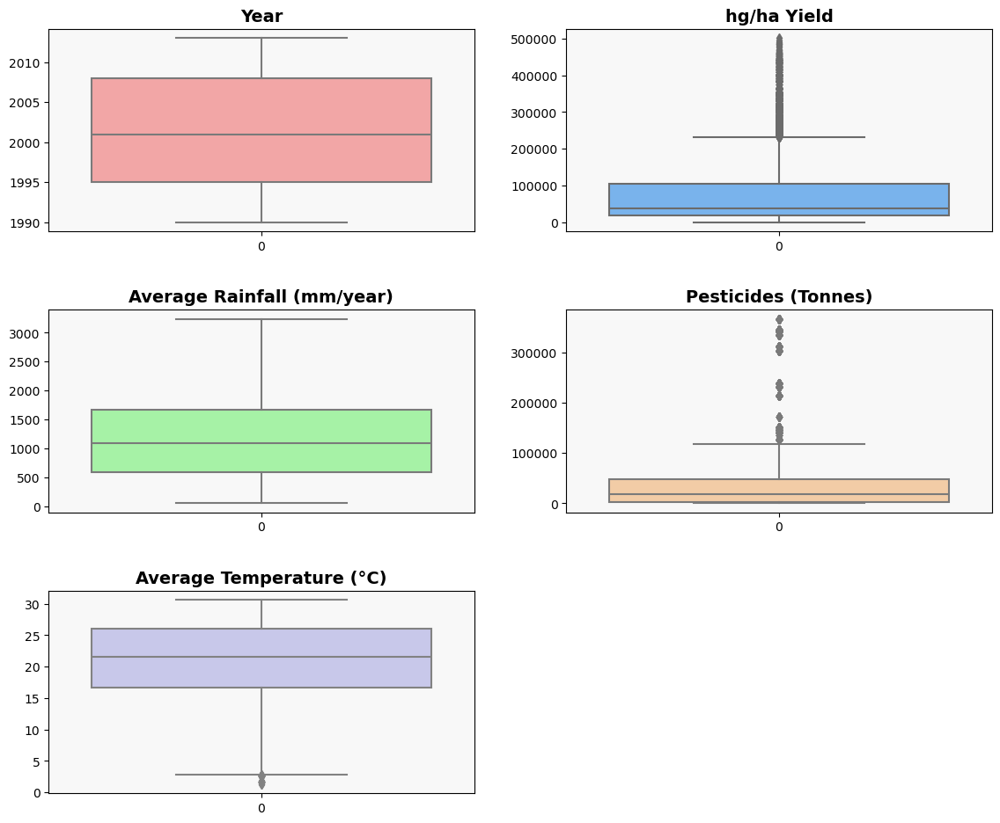

In [16]:
# Create the figure with specified size
fig = plt.figure(figsize=(12, 10))

# Subplots for different variables with updated colors
ax1 = plt.subplot(3, 2, 1)
sns.boxplot(data=crop_yield_df['Year'], color='#ff9999', ax=ax1)  # Light red
ax1.set_title('Year', fontsize=14, fontweight='bold')
ax1.set_xlabel('')
ax1.set_facecolor('#f8f8f8')  # Light gray background

ax2 = plt.subplot(3, 2, 2)
sns.boxplot(data=crop_yield_df['hg/ha_yield'], color='#66b3ff', ax=ax2)  # Light blue
ax2.set_title('hg/ha Yield', fontsize=14, fontweight='bold')
ax2.set_xlabel('')
ax2.set_facecolor('#f8f8f8')

ax3 = plt.subplot(3, 2, 3)
sns.boxplot(data=crop_yield_df['average_rain_fall_mm_per_year'], color='#99ff99', ax=ax3)  # Light green
ax3.set_title('Average Rainfall (mm/year)', fontsize=14, fontweight='bold')
ax3.set_xlabel('')
ax3.set_facecolor('#f8f8f8')

ax4 = plt.subplot(3, 2, 4)
sns.boxplot(data=crop_yield_df['pesticides_tonnes'], color='#ffcc99', ax=ax4)  # Peach
ax4.set_title('Pesticides (Tonnes)', fontsize=14, fontweight='bold')
ax4.set_xlabel('')
ax4.set_facecolor('#f8f8f8')

ax5 = plt.subplot(3, 2, 5)
sns.boxplot(data=crop_yield_df['avg_temp'], color='#c2c2f0', ax=ax5)  # Light purple
ax5.set_title('Average Temperature (°C)', fontsize=14, fontweight='bold')
ax5.set_xlabel('')
ax5.set_facecolor('#f8f8f8')

plt.tight_layout(pad=3.0)

# Display the plot
plt.show()

Boxplots are an essential tool for understanding the distribution, central tendency, and outliers of key variables in the crop_yield_df dataset. These visualizations offer a clear representation of how data is spread across different dimensions, providing insights into variability and anomalies.

The boxplot for the Year variable shows a consistent temporal distribution of entries between 1990 and 2013, with the median centered around the year 2000. This indicates a balanced dataset in terms of time coverage, ensuring that no particular year is overrepresented or underrepresented.

The hg/ha Yield boxplot highlights the variability in crop yield per hectare. The distribution is highly skewed, with the majority of data concentrated at lower yields and several extreme outliers far above the upper whisker. These outliers may represent extraordinary cases of agricultural productivity or data anomalies that require further investigation. This visualization underscores the importance of addressing outliers during analysis to ensure robust conclusions.

The Average Rainfall boxplot reflects the diversity of climatic conditions captured in the dataset. Most areas receive moderate rainfall, as indicated by the interquartile range, but a few regions experience significantly higher or lower rainfall, possibly due to arid conditions or excessive precipitation. These variations are critical for analyzing the relationship between rainfall and crop yield.

The boxplot for Pesticides (Tonnes) reveals a concentration of data points at lower pesticide usage levels, with a few extreme outliers representing heavy pesticide application in certain areas. These outliers may indicate regions with intensive farming practices or unique agricultural requirements. Understanding the impact of such heavy usage on yield and environmental sustainability is an area for deeper exploration.

Finally, the Average Temperature (°C) boxplot demonstrates that most temperatures fall within a moderate range, conducive to agricultural productivity. However, there are a few colder regions with temperatures below 5°C, which may represent data from high-altitude or polar areas. These variations highlight the dataset's geographic diversity and its potential for studying crop performance under varying climatic conditions.

## Milestone 2

In [24]:
# Second Plot: Bar Chart - Total Yield for Top 5 Crops
top_crops = crop_yield_df.groupby('Item')['hg/ha_yield'].sum().sort_values(ascending=False).head(5).reset_index()

bar_fig = px.bar(
    top_crops,
    x='Item',
    y='hg/ha_yield',
    color='Item',
    title='Total Yield for Top 5 Crops',
    labels={
        'hg/ha_yield': 'Total Yield (hg/ha)',
        'Item': 'Crop Type'
    },
    color_discrete_sequence=px.colors.qualitative.Set3
)
bar_fig.update_layout(
    plot_bgcolor='#f5f5f5',
    paper_bgcolor='#eaeaea',
    margin=dict(l=40, r=40, t=60, b=40),
    xaxis=dict(title='Crop Type', tickangle=0),
    yaxis=dict(title='Total Yield (hg/ha)')
)
bar_fig.show()


The bar chart shows the total yield (hg/ha) for the top 5 crops.
Potatoes have the highest total yield, followed by Sweet Potatoes and Cassava.
Maize and Rice, paddy also contribute significantly but lag behind the top three crops.
This visualization helps identify the crops that dominate in yield, which could guide further analysis on factors influencing their productivity.


In [18]:
# Group by 'Item' and sum the 'pesticides_tonnes'
item_pesticides = crop_yield_df.groupby('Item')['pesticides_tonnes'].sum().reset_index()

# Create a bar chart using Plotly
fig = px.bar(
    item_pesticides,
    x='Item',
    y='pesticides_tonnes',
    color='pesticides_tonnes',
    color_continuous_scale='viridis',
    title='Total Pesticides Usage by Item',
    labels={
        'pesticides_tonnes': 'Total Pesticides (tonnes) in (hundred millions)',
        'Item': 'Crop Type'
    }
)

# Customize the layout
fig.update_layout(
    title=dict(font=dict(size=16, family='Arial, bold'), x=0.5),
    xaxis=dict(title='Item', tickangle=45),
    yaxis=dict(title='Total Pesticides (tonnes)'),
    plot_bgcolor='#f9f9f9',
    paper_bgcolor='#eaeaea',
    coloraxis_colorbar=dict(title='Pesticides (tonnes)'),
    margin=dict(l=40, r=40, t=60, b=100)
)

# Show the bar chart
fig.show()

The heavy pesticide usage for crops like Maize and Potatoes could raise environmental and sustainability concerns, particularly regarding soil health and water contamination. Crops with lower pesticide usage, like Yams and Plantains, may represent more sustainable agricultural practices and could be prioritized for expansion in eco-conscious farming initiatives. 

In [19]:
# Group by 'Area' and sum the 'hg/ha_yield'
country_yield = crop_yield_df.groupby('Area')['hg/ha_yield'].sum().reset_index()

# Sort the countries by yield in descending order and select the top 20
top_countries_yield = country_yield.sort_values(by='hg/ha_yield', ascending=False).head(20)

# Create a horizontal bar chart using Plotly
fig = px.bar(
    top_countries_yield,
    x='hg/ha_yield',
    y='Area',
    orientation='h',
    color='hg/ha_yield',
    color_continuous_scale='Blues',
    title='Top 20 Countries by Total hg/ha Yield',
    labels={
        'hg/ha_yield': 'Total hg/ha Yield',
        'Area': 'Country'
    }
)

# Customize the layout
fig.update_layout(
    title=dict(font=dict(size=18, family='Arial, bold'), x=0.5, y=0.95),
    xaxis=dict(title='Total hg/ha Yield', showgrid=True, gridcolor='lightgray'),
    yaxis=dict(title='Country', showgrid=False),
    plot_bgcolor='#f5f5f5',
    paper_bgcolor='#eaeaea',
    coloraxis_colorbar=dict(title='hg/ha Yield'),
    margin=dict(l=60, r=40, t=60, b=60)
)

# Show the bar chart
fig.show()

In [22]:
# First Plot: Scatter Plot - Relationship between Average Rainfall and Yield
scatter_fig = px.scatter(
    crop_yield_df,
    x='average_rain_fall_mm_per_year',
    y='hg/ha_yield',
    color='Item',
    size='pesticides_tonnes',
    hover_data=['Area', 'Year'],
    title='Relationship Between Average Rainfall and Yield (hg/ha)',
    labels={
        'average_rain_fall_mm_per_year': 'Average Rainfall (mm/year)',
        'hg/ha_yield': 'Yield (hg/ha)',
        'Item': 'Crop Type'
    },
    color_continuous_scale='Viridis'
)
scatter_fig.update_layout(
    plot_bgcolor='#f5f5f5',
    paper_bgcolor='#eaeaea',
    margin=dict(l=40, r=40, t=60, b=40)
)
scatter_fig.show()

Insights: \
Yield increases with rainfall up to 1,500 mm/year, then plateaus or decreases.\
Maize and Potatoes perform well across diverse rainfall levels, showing resilience.\
Rice requires higher rainfall (1,500–2,500 mm/year), clustering in wetter regions.\
Crops like Sorghum and Soybeans thrive in low rainfall areas (<500 mm/year).\
High-yield outliers (>400k hg/ha) indicate optimized practices or specific conditions.\
Larger points (higher pesticide usage) are frequent for Maize and Potatoes at mid-range rainfall.\
Crop diversity reflects varying water needs and adaptability to rainfall conditions.

## Milestone 3

In [25]:
# First Plot: Scatter Plot with Dropdown and Zooming
scatter_fig = px.scatter(
    crop_yield_df,
    x='average_rain_fall_mm_per_year',
    y='hg/ha_yield',
    color='Item',
    size='pesticides_tonnes',
    hover_data=['Area', 'Year'],
    title='Interactive Scatter Plot: Rainfall vs Yield',
    labels={
        'average_rain_fall_mm_per_year': 'Average Rainfall (mm/year)',
        'hg/ha_yield': 'Yield (hg/ha)',
        'Item': 'Crop Type'
    },
    color_continuous_scale='Plasma'
)
# Add dropdown for filtering specific crops
scatter_fig.update_layout(
    updatemenus=[
        {
            "buttons": [
                {"label": "All Crops", "method": "update", "args": [{"visible": True}]},
                *[{
                    "label": crop, 
                    "method": "update", 
                    "args": [{"visible": crop_yield_df['Item'] == crop}]
                  } for crop in crop_yield_df['Item'].unique()]
            ],
            "direction": "down",
            "showactive": True,
        }
    ],
    xaxis=dict(rangeslider=dict(visible=True)),
    yaxis=dict(title='Yield (hg/ha)')
)
scatter_fig.show()

In [26]:
# Second Plot: Line Plot with Dropdown and Zooming
yearly_crop_data = crop_yield_df.groupby(['Year', 'Item'])['hg/ha_yield'].mean().reset_index()
line_fig = px.line(
    yearly_crop_data,
    x='Year',
    y='hg/ha_yield',
    color='Item',
    title='Interactive Line Plot: Yield Trends by Crop Type',
    labels={
        'Year': 'Year',
        'hg/ha_yield': 'Yield (hg/ha)',
        'Item': 'Crop Type'
    }
)

# Add dropdown to select specific crops
line_fig.update_layout(
    updatemenus=[
        {
            "buttons": [
                {"label": "All Crops", "method": "update", "args": [{"visible": True}]},
                *[{
                    "label": crop, 
                    "method": "update", 
                    "args": [{"visible": yearly_crop_data['Item'] == crop}]
                  } for crop in yearly_crop_data['Item'].unique()]
            ],
            "direction": "down",
            "showactive": True,
        }
    ],
    xaxis=dict(rangeslider=dict(visible=True)),
    yaxis=dict(title='Yield (hg/ha)')
)
line_fig.show()

### Insights fro mthese Interactive Visualizations 
**Rainfall-Yield Relationship**: Yield generally increases with rainfall up to ~1,500 mm/year but diminishes or becomes inconsistent with excessive rainfall above 2,500 mm/year, indicating potential adverse effects like flooding.

**Crop-Specific Behavior**: Crops like Potatoes and Sweet Potatoes perform well across diverse rainfall levels, while Rice, paddy thrives in higher rainfall regions (~1,500–2,500 mm/year), reflecting their unique water requirements.

**Pesticide Usage Patterns**: Higher pesticide usage (larger points) is prominent for crops like Maize and Potatoes, especially at mid-range rainfall levels, showing their reliance on chemical inputs for maximizing yields.

**Yield Trends Over Time**: Crops such as Cassava, Potatoes, and Sweet Potatoes show increasing yields over the years, highlighting advancements in agricultural practices, while crops like Sorghum and Soybeans exhibit stable or flat trends.

**Dominant Crops**: Cassava consistently leads in yield, followed by Potatoes and Sweet Potatoes, making them critical crops for productivity, while other crops like Maize and Rice, paddy display moderate yields with more variability.